# **Analysis of Decision Tree and Naïve Bayes Models for Customer Churn Prediction in Imbalanced Class Distribution**

The primary objective of this project is to analyze and characterize customer churn and develop predictive models (Decision Tree and Naive Bayes) to determine whether existing customers will continue to use the telecommunications services of the company in the near future. Our team aims to gain valuable insights into customer behavior and patterns that contribute to churn from a dataset with 3,333 observations and 21 features, so as to help our company make better marketing strategies, optimize customer satisfaction, and enhance overall business performance.

To ensure the quality performance of the two classifiers that we developed, a variety of approaches were implemented throughout the project. In the exploratory data analysis stage, our team made some important findings, including the correlations between the labels and features, the correlation between different features, imbalanced class distributions, and the importance of the outliers. Baseline models were created after carefully dropping the irrelevant features. To prepare the data for modeling, we applied one-hot encoding to handle categorical variables effectively. Additionally, we split the dataset into three subsets using a Train-Validation-Test approach, with 60% of the data used for training, 20% for validation, and 20% for testing. To further improve the models, our team fine-tuned the models with the best values of the hyperparameters and adjusted the threshold. These strategies contributed to building more robust and accurate predictive models.



In [1]:
import sys
!{sys.executable} -m pip install -U pandas-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz
import pandas as pd
from scipy.io import arff
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_predict
from sklearn import tree
import graphviz
from sklearn.metrics import f1_score, average_precision_score, classification_report, confusion_matrix, precision_recall_curve
from sklearn.naive_bayes import MultinomialNB
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer
import warnings
warnings.filterwarnings('ignore')

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 262.6/262.6 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.8/309.8 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 11.7 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=4b57d10b5f5b719131b13c76f8008a6736473bee3dab246dc6c4246883b0f873
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
  Attempting uninstall:

# Initial data processing



In [3]:
# data loading
data_file="churn.arff"
data=arff.loadarff(data_file)

df=pd.DataFrame(data[0])
for col in df.columns:
  if df[col].dtype=='object':
    #making sure data is not read as bytes but as string values from a file
    df[col] = df[col].str.decode('utf-8')

df.head(5)

,State,Account Length,Area Code,Phone Number,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,...,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Churn
0,OH,107.0,A415,371-7191,no,yes,26.0,161.6,123.0,27.47,...,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,FALSE
1,NJ,137.0,A415,358-1921,no,no,0.0,243.4,114.0,41.38,...,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,FALSE
2,OH,84.0,A408,375-9999,yes,no,0.0,299.4,71.0,50.90,...,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,FALSE
3,OK,75.0,A415,330-6626,yes,no,0.0,166.7,113.0,28.34,...,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,FALSE
4,AL,118.0,A510,391-8027,yes,no,0.0,223.4,98.0,37.98,...,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,FALSE


In [3]:
df.describe()

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [4]:
# String categories to numberic categories
cat_cols=["State","Area Code", "Phone Number", "Inter Plan","VoiceMail Plan"]
class_col_name="Churn"
df_onehot=df.copy()
df_onehot = pd.get_dummies(df_onehot, columns=cat_cols, prefix = cat_cols)
one_hot_feature_names=df_onehot.columns[df_onehot.columns != class_col_name]

# split data by 60% train set, 20% validation set, 20% test set.
X = df_onehot.loc[:, one_hot_feature_names]
y = df_onehot[class_col_name]
train_set_X, test_X, train_set_y, test_y = train_test_split(X, y, test_size=0.2, stratify=y, random_state=10)
train_X, validate_X, train_y, validate_y = train_test_split(train_set_X, train_set_y, test_size=0.25, random_state=1)


In [6]:
# Decision tree
model_dtree = tree.DecisionTreeClassifier(max_depth=5)
model_dtree.fit(train_X, train_y)
pred_y = model_dtree.predict(validate_X)
f1_dtree = f1_score(validate_y, pred_y, average='binary', pos_label='TRUE')
print(classification_report(validate_y, pred_y))


              precision    recall  f1-score   support

       FALSE       0.95      0.97      0.96       577
        TRUE       0.81      0.69      0.74        90

    accuracy                           0.94       667
   macro avg       0.88      0.83      0.85       667
weighted avg       0.93      0.94      0.93       667



In order to demonstrate that our data processing steps can improve the performance of the classifiers, our team trained a baseline Decision Tree model before applying any major data manipulation. As shown in the figure above, the Decision Tree’s performance under limited preprocessing resulted in a precision of 0.81, a recall of 0.69, and an F1-score of 0.74 for the true class. This means that 82% of the instances predicted as true were actually correct, while 69% of the actual positive instances were correctly identified by the model. The F1-score of 0.75 indicates a reasonable trade-off between precision and recall.


# Further data prepration and EDA

## Data analysis

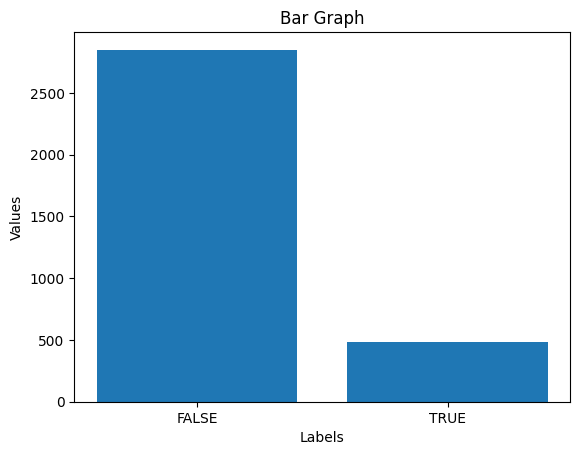

In [6]:
# TODO figure out ways to reduce the effect of imbalance dataset
plt.bar(df.Churn.unique(), df.Churn.value_counts())
plt.xlabel('Labels')
plt.ylabel('Values')
plt.title('Bar Graph')
plt.show()

The findings from the report indicate a significant problem with imbalanced class distributions. 85.5% of the observations (2850) are classified as "False" (non-churn) meanwhile only 14.5% (483) as "True" (churn). with the "False" class being approximately 4.9 times more than the True" class. In this case, using accuracy as the key metric might be misleading as high accuracy can be achieved by a classifier that simply predicts the False (non-churn), but the classifier could be ineffective for predicting the minority class (churn).


Given the imbalanced distribution and our focus on the minority class, the F1-score for the "True" class will be the key performance metric used to evaluate classifiers in this project. This metric is particularly valuable when working with imbalanced datasets where the minority class is of greater interest, as it incorporates both precision and recall. It penalizes classifiers that have a high number of false negatives (low recall) or false positives (low precision), balancing the trade-off between false positives and false negatives.


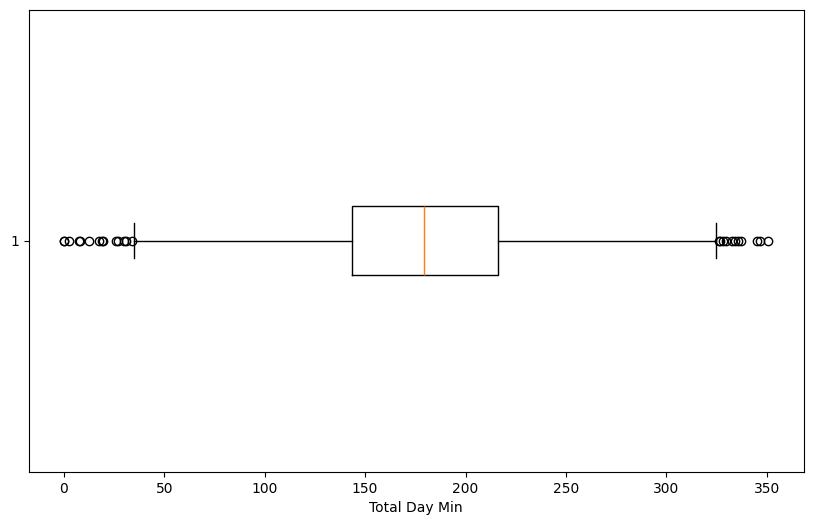

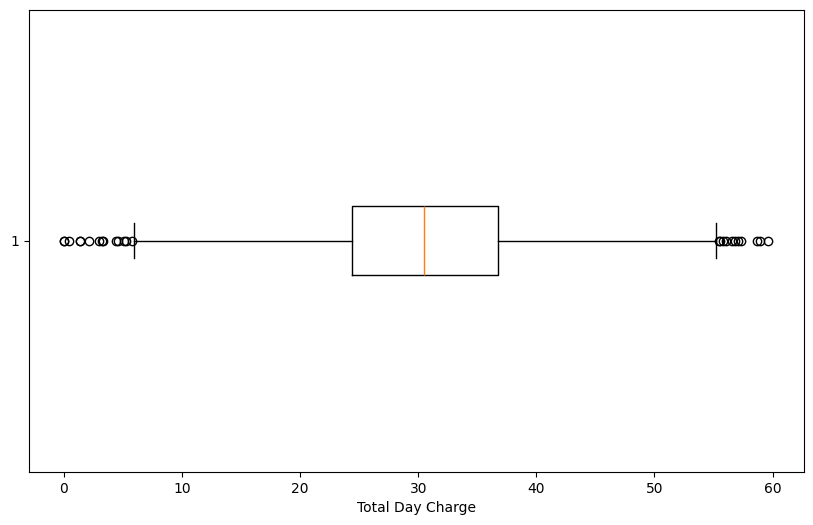

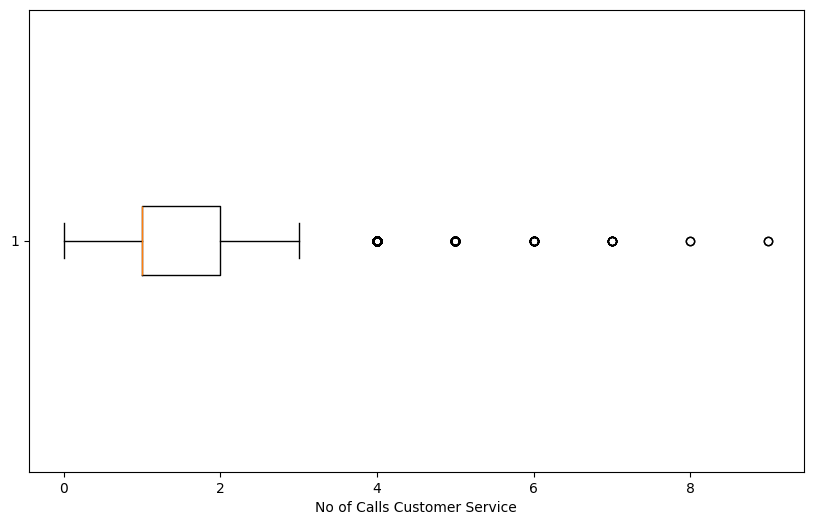

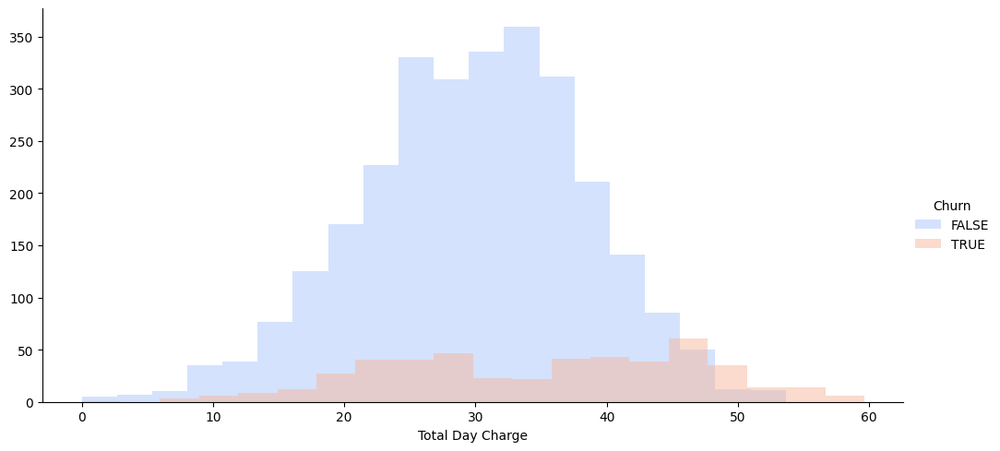

In [7]:
import pandas as pd
import matplotlib.pyplot as plt



columns = ['Total Day Min', 'Total Day Charge', 'No of Calls Customer Service']

for column in columns:
  plt.figure(figsize=(10, 6))
  plt.boxplot(df[column], vert=False)
  plt.xlabel(column)
  # plt.title('Box Plot of Values with Outliers')
  plt.show()

column = 'Total Day Charge'
g = sns.FacetGrid(df, hue="Churn", height=5, aspect=2, palette='coolwarm')
g = g.map(plt.hist, column, bins=20, alpha=0.5).add_legend()

From the table and boxplots above, it clearly shows that there are some outliers in the dataset, but some valuable insights can be found because of the outliers. Taking the correlation between “churn” and “total day charge” and “churn” and “number of calls to customer service” as examples, customers who made an excessive number of calls to customer service have churned and those who paid an excessive amount of charges have also churned. These two examples demonstrate the importance of the outliers in this dataset.
Considering the importance of the outliers and the fact that there is no missing value in the dataset, no major adjustment is needed for our dataset, except for removing some irrelevant attributes.


## Analysis using ProfileReport

The Profile Report reveals several important findings:

Imbalanced class distribution: The target variable is not evenly distributed, which may impact model performance and necessitate the use of techniques such as resampling or class weighting.

No missing values: The dataset is complete, requiring no imputation or data cleaning for missing entries.

Presence of outliers: Several key features contain outliers, which may provide valuable insights.

Correlations with the target variable: Some features show noticeable correlation with the target label, including Number of Customer Service Calls, Total Day Charge, International Plan, and Voice Mail Plan, suggesting they may be useful predictors of churn.

Correlations among input features: Total Day Minutes, Total Evening Minutes, Total International Minutes, and Total Night Minutes were excluded because they are highly—often perfectly—correlated with their corresponding charge features (Total Day Charge, Total Evening Charge, etc.). Since they convey the same information, retaining both would introduce redundancy and potential multicollinearity, offering no added value to the model.

In [9]:
!pip uninstall pandas-profiling
!pip install ydata-profiling

from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:01<00:00, 15.72it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data prepration

Based on the exploratory data analysis, our team decided to drop several attributes, including “Total Day Minutes”, “Total Evening Minutes”, “Total International Minutes”, “Account Length”, “Total Night Calls”, “Total Night Minutes”, “Total Night Charge”, “Total Evening Calls”, “Area Code”, “Phone Number”, and “Total Day Calls.”

“Account Length,” “Phone Number,” “Total Evening Calls,” “Area Code,” “Total Night Calls,” “Total Night Minutes,” and “Total Night Charge” were removed because their correlation with the churn class was significantly low. These features do not appear to influence customer decisions and are therefore not suitable for training classifiers that predict churn.

In addition, “Total Day Minutes,” “Total Evening Minutes,” and “Total International Minutes” were excluded due to high—often perfect—correlation with their respective charge features. As a result, these "Minutes" features are redundant and unnecessary for model training.


In [ ]:
# Drop useless columns
drop_columns = ['Total Day Min', 'Total Evening Min', 'Total Int Min', 'Account Length', 'Total Night Calls', 'Total Night Minutes', 'Total Night Charge', 'Total Evening Calls', 'Area Code', 'Phone Number', 'Total Day calls']
df = df.drop(drop_columns, axis=1)


cat_cols=["State", "Inter Plan","VoiceMail Plan"]
class_col_name="Churn"
df_onehot=df.copy()
df_onehot = pd.get_dummies(df_onehot, columns=cat_cols, prefix = cat_cols)
one_hot_feature_names=df_onehot.columns[df_onehot.columns != class_col_name]

# split data by 60% train set, 20% validation set, 20% test set.
X = df_onehot.loc[:, one_hot_feature_names]
y = df_onehot[class_col_name]
train_set_X, test_X, train_set_y, test_y = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1)
train_X, validate_X, train_y, validate_y = train_test_split(train_set_X, train_set_y, test_size=0.25, random_state=1)

## Train new models with the new data
Examine the effects of dropping redundant and unnecessary features on the performance of the models. The results below reflect the attributes we dropped were truly irrelevant and redundant, we compared the performance of the Decision Tree with its initial results (before major data processing) and confirmed that there was no substantial change.

              precision    recall  f1-score   support

       FALSE       0.95      0.99      0.97       564
        TRUE       0.93      0.72      0.81       103

    accuracy                           0.95       667
   macro avg       0.94      0.85      0.89       667
weighted avg       0.95      0.95      0.94       667



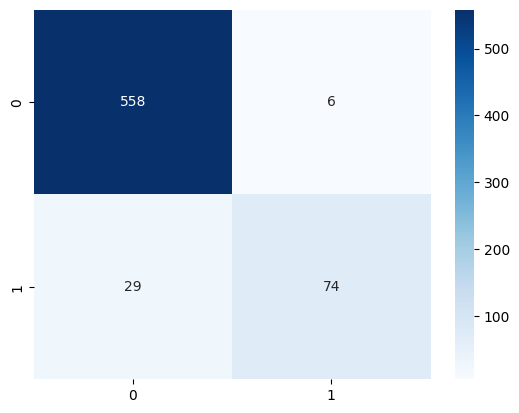

In [ ]:
# Decision tree
model_dtree = tree.DecisionTreeClassifier(max_depth=5)
model_dtree.fit(train_X, train_y)
pred_y = model_dtree.predict(validate_X)
f1_dtree = f1_score(validate_y, pred_y, average='binary', pos_label='TRUE')
print(classification_report(validate_y, pred_y))
sns.heatmap(confusion_matrix(validate_y, pred_y), annot=True, cmap='Blues', fmt='g');


              precision    recall  f1-score   support

       FALSE       0.91      0.36      0.52       564
        TRUE       0.19      0.80      0.30       103

    accuracy                           0.43       667
   macro avg       0.55      0.58      0.41       667
weighted avg       0.80      0.43      0.48       667



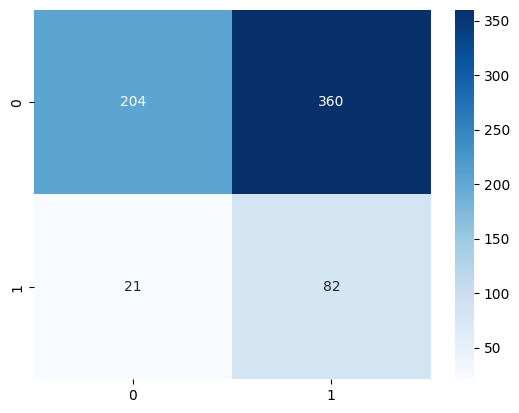

In [ ]:
# Naive bayes
model_nb = MultinomialNB()
model_nb.fit(train_X, train_y)
pred_y = model_nb.predict(validate_X)
f1_nb = f1_score(validate_y, pred_y, average='binary', pos_label='TRUE')
print(classification_report(validate_y, pred_y))
sns.heatmap(confusion_matrix(validate_y, pred_y), annot=True, cmap='Blues', fmt='g');

The results clearly show that the Decision Tree model generally outperforms Naive Bayes in terms of overall predictive performance. The Decision Tree achieves a precision of 0.93, a recall of 0.72, and an F1-score of 0.81 for the true class (churn), while Naive Bayes records a precision of only 0.19, a recall of 0.80, and an F1-score of 0.30 for the same class.

Although the recall of Naive Bayes is slightly higher than that of the Decision Tree by 0.08, its much lower precision results in a significant number of false positives. Specifically, a large number of non-churned customers (360 observations) are incorrectly classified as churned. This leads to a low F1-score due to the imbalance between precision and recall.

These results demonstrate that the Decision Tree is better at correctly identifying true churned customers while minimizing false alarms. Therefore, the Decision Tree is considered to be a more effective and reliable model at this stage.


## Tuning hyperparamters on the validation set


In [ ]:
# Create callable metric based on f1-score of True class.
f1_scorer = make_scorer(f1_score, pos_label='TRUE')

# Define stratified sampling method to be used with GridSearchCV.
skfold = StratifiedKFold(n_splits=5)

### Decision tree

In [ ]:
# Decision tree
param_grid = {'max_depth': range(1, 11), 'min_samples_leaf': range(1, 11), 'min_samples_split': range(2, 11),
              'criterion': ['gini','entropy']}
gs_dtree = GridSearchCV(model_dtree, param_grid, cv=skfold, scoring=f1_scorer)
gs_dtree.fit(train_X,train_y)
print(gs_dtree.best_params_)

{'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 4}


Given that each model has many hyperparameters, it is difficult to manually determine the optimal values for each. To address this, our team performed a grid search to identify the best combination of hyperparameters for the models. The best values of hyperparameters for the decision Tree classifier are as follows: “criteria” = entropy, “max_dept” = 10, “min_samples_leaf” = 2, “min_samples_spli” = 4


              precision    recall  f1-score   support

       FALSE       0.96      0.98      0.97       564
        TRUE       0.89      0.80      0.84       103

    accuracy                           0.95       667
   macro avg       0.93      0.89      0.91       667
weighted avg       0.95      0.95      0.95       667





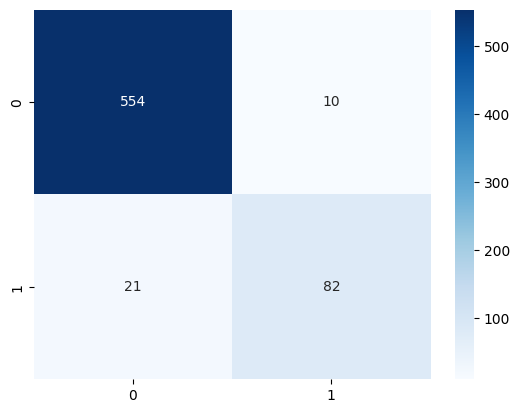

In [ ]:
# Evaluate new model using parameters above.
tuned_dtree = tree.DecisionTreeClassifier(
    criterion = gs_dtree.best_params_['criterion'],
    max_depth = gs_dtree.best_params_['max_depth'],
    min_samples_leaf = gs_dtree.best_params_['min_samples_leaf'],
    min_samples_split = gs_dtree.best_params_['min_samples_split']
  )

tuned_dtree.fit(train_X, train_y)
predictions_tuned_dtree = tuned_dtree.predict(validate_X)

# summarize
print(classification_report(validate_y, predictions_tuned_dtree))
print('\n')
sns.heatmap(confusion_matrix(validate_y, predictions_tuned_dtree), annot=True, cmap='Blues', fmt='g');

After tuning the hyperparameters for the Decision Tree model, there was a noticeable improvement in performance. The recall for the true class (churn) increased by 0.08, rising from 0.72 to 0.80. Out of 103 actual churn cases, the model is now able to correctly identify 82 of them. This means the fine-tuned Decision Tree captures 8% more of the actual churning customers compared to the baseline model.
Although precision slightly decreased by 0.04, from 0.93 to 0.89, this trade-off is considered acceptable. In this context, correctly identifying customers who are likely to churn is more critical than avoiding false positives, as the primary goal is to understand why customers are churning in order to address the underlying issues. The increase in the F1-score, from 0.81 to 0.84, demonstrates that the model has achieved a better balance between precision and recall, further justifying the trade-off.


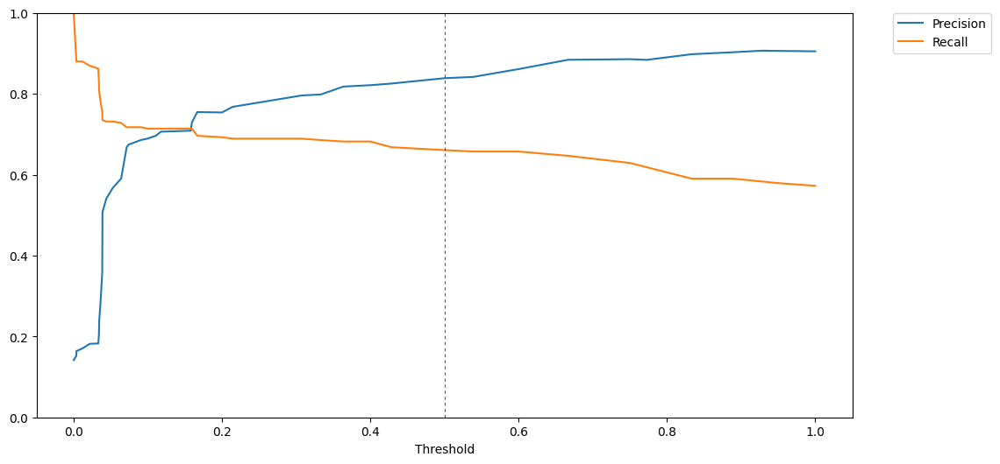

In [ ]:
# create function to plot PR curve.
def plot_pr_curve(model, train_X_input):
    y_scores = cross_val_predict(model, train_X_input, train_y, cv=5, method="predict_proba")
    precisions, recalls, thresholds = precision_recall_curve(train_y, y_scores[:, 1], pos_label='TRUE')

    plt.figure(figsize=(12, 6))
    plt.plot(thresholds, precisions[:-1], label="Precision")
    plt.plot(thresholds, recalls[:-1], label="Recall")
    plt.axvline(x=0.5, linewidth = 0.5, color = 'black', linestyle='--', dashes=(5, 5))
    plt.xlabel("Threshold")
    plt.ylim([0, 1])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Pass in tuned model into function
plot_pr_curve(tuned_dtree, train_X)
plt.show()

Ideally, the model should minimize the risk of overlooking customers who are likely to churn, even if that means occasionally misclassifying some who won’t. In other words, it's acceptable to prioritize higher recall at the expense of some loss in precision. According to the Precision-Recall (PR) curve, this would typically involve selecting a threshold lower than the default 50%.

However, the PR curve suggests that lowering the threshold does not significantly improve recall without causing a substantial drop in precision. Additionally, testing various threshold values using the code below confirms this observation. Therefore, the default threshold of 50% is retained.

### Naive bayes

In [ ]:
# Grid Serach for Naive bayes
param_grid = {'alpha': list(np.arange(10)/10), 'fit_prior': [True, False], 'class_prior': [None, list(df.Churn.value_counts())]}
gs_nb = GridSearchCV(model_nb, param_grid, cv=skfold, scoring=f1_scorer)
gs_nb = GridSearchCV(model_nb, param_grid, scoring=f1_scorer)
gs_nb.fit(train_X,train_y)
print(gs_nb.best_params_)

{'alpha': 0.1, 'class_prior': None, 'fit_prior': True}


              precision    recall  f1-score   support

       FALSE       0.91      0.37      0.53       564
        TRUE       0.19      0.80      0.30       103

    accuracy                           0.44       667
   macro avg       0.55      0.59      0.42       667
weighted avg       0.80      0.44      0.50       667





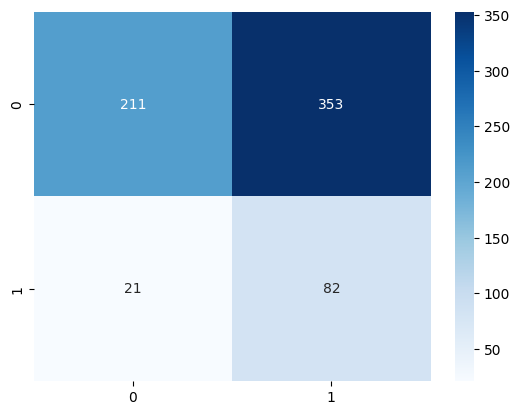

In [ ]:
tuned_nb = MultinomialNB(
    alpha=gs_nb.best_params_['alpha'],
    class_prior=gs_nb.best_params_['class_prior'],
    fit_prior=gs_nb.best_params_['fit_prior']
)
tuned_nb.fit(train_X, train_y)
predictions_tuned_nb = tuned_nb.predict(validate_X)

# summarize
print(classification_report(validate_y, predictions_tuned_nb))
print('\n')
sns.heatmap(confusion_matrix(validate_y, predictions_tuned_nb), annot=True, cmap='Blues', fmt='g');

As for the Naive Bayes model, fine-tuning the hyperparameters did not lead to any significant improvement. All key metrics—recall, precision, and F1-score—remained unchanged. Therefore, we decided to explore additional ways to enhance the model’s performance. After identifying the optimal classification threshold, our team adjusted the model accordingly for further improvement.


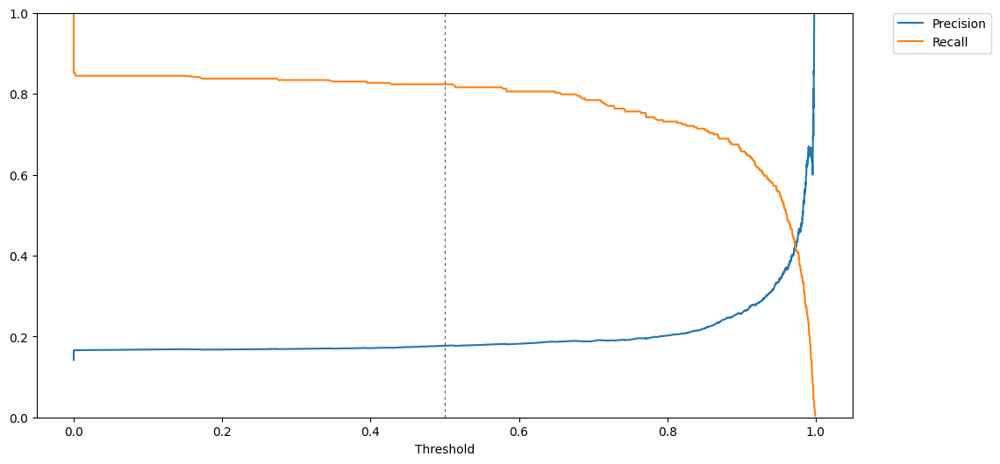

In [ ]:
plot_pr_curve(tuned_nb, train_X)
plt.show()

Based on the plot above, we observed that precision can increase significantly at the expense of recall. After conducting multiple trials with different thresholds, we found that a threshold of 0.94 produced the most favorable results.


<class 'str'>
              precision    recall  f1-score   support

       FALSE       0.92      0.83      0.87       564
        TRUE       0.38      0.58      0.46       103

    accuracy                           0.79       667
   macro avg       0.65      0.70      0.66       667
weighted avg       0.83      0.79      0.81       667





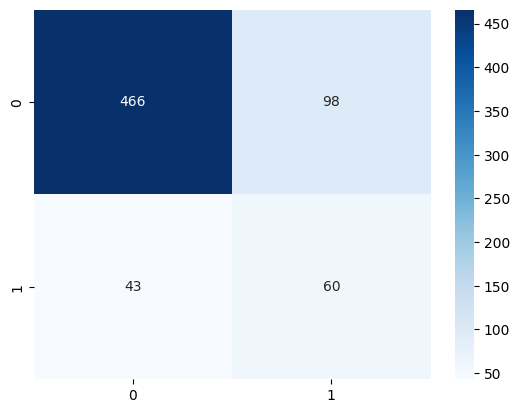

In [ ]:
threshold_nb = .94
predictions_tuned_nb = tuned_nb.predict_proba(validate_X)
predictions_tuned_nb = np.where(predictions_tuned_nb[:,1] >= threshold_nb, 'TRUE', 'FALSE')
print(type(validate_y.iloc[0]))
print(classification_report(validate_y, predictions_tuned_nb))
print('\n')
sns.heatmap(confusion_matrix(validate_y, predictions_tuned_nb), annot=True, cmap='Blues', fmt='g');



At this threshold, there is a noticeable drop in recall for the true class (churn), decreasing from 0.80 to 0.58. The model now correctly predicts 60 out of 103 actual churn cases (58%). However, this adjustment leads to a substantial improvement in both precision and F1-score for the churn class.

Previously, the precision for the churn class was only 0.19—meaning that out of 434 predictions labeled as churn, only 82 were correct. After adjusting the threshold to 0.94, precision increases by 200% to 0.38, with 62 correct predictions out of 158 predicted churn cases.

While correctly identifying churned customers is the primary focus of this task, the model must also avoid completely neglecting the majority class (non-churn). As discussed earlier, the F1-score is the key evaluation metric in this project because it balances both precision and recall. It penalizes classifiers for both false positives (low precision) and false negatives (low recall), providing a more balanced view of model performance.

The increase in F1-score from 0.30 to 0.46 demonstrates that our threshold adjustment effectively improved the Naive Bayes model’s performance.


## Testing on the test set

In [ ]:
# Create function to extract relevent info from classification report
def report_to_df(report):
    report = [x.split(' ') for x in report.split('\n')]
    header = ['class']+[x for x in report[0] if x!='']
    values = []
    for row in report[3:-5]:
        row = [value for value in row if value!='']
        if row!=[]:
            values.append(row)
    df_report = pd.DataFrame(data = values, columns = header)
    return df_report

In [ ]:
final_predictions_dtree = tuned_dtree.predict_proba(test_X)
final_predictions_dtree = np.where(final_predictions_dtree[:,1] >= threshold_dtree, 'TRUE', 'FALSE')

final_predictions_nb = tuned_nb.predict_proba(test_X)
final_predictions_nb = np.where(final_predictions_nb[:,1] >= threshold_nb, 'TRUE', 'FALSE')

final_models = pd.concat([report_to_df(classification_report(test_y, final_predictions_dtree)),
                          report_to_df(classification_report(test_y, final_predictions_nb))])

final_models.insert(0, 'classifier', ['Decision Tree', 'Naive Bayes'])
final_models.insert(1, 'threshold', [threshold_dtree, threshold_nb])
final_models = final_models.drop(['class','support'], axis=1)
final_models

,classifier,threshold,precision,recall,f1-score
0,Decision Tree,0.50,0.83,0.74,0.78
0,Naive Bayes,0.94,0.32,0.59,0.41


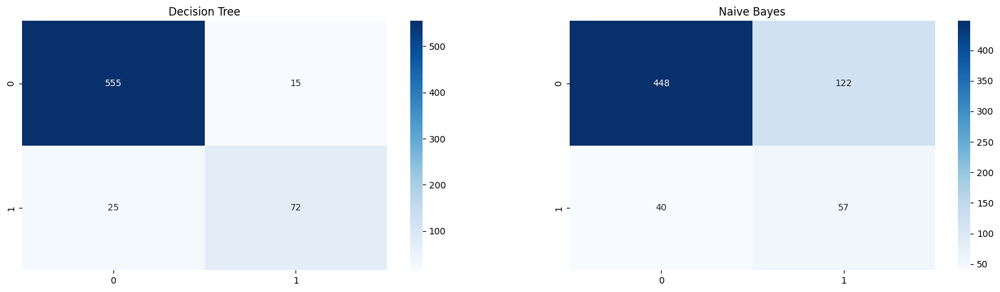

In [ ]:
# Plot confusion matrix for each model
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
sns.heatmap(confusion_matrix(test_y, final_predictions_dtree), annot=True, cmap='Blues', fmt='g', ax=ax1)
ax1.set_title('Decision Tree')
sns.heatmap(confusion_matrix(test_y, final_predictions_nb), annot=True, cmap='Blues', fmt='g', ax=ax2)
ax2.set_title('Naive Bayes')
plt.show()

On the test set, both classifiers perform worse compared to their performance on the validation set, which is expected since the models were fine-tuned on the validation data.
For the Decision Tree, the precision, recall, and F1-score for the true class (churn) decrease to 0.83, 0.74, and 0.78, respectively. In the case of Naive Bayes, the precision for the true class drops from 0.38 to 0.32, while recall slightly increases from 0.58 to 0.59. However, since the F1-score balances precision and recall and is the key metric for this project, its decrease from 0.46 to 0.41 indicates an overall weaker performance of Naive Bayes on the test set.
Despite the decline in the Decision Tree’s performance on the test set compared to the validation set, it still noticeably outperforms Naive Bayes across all metrics—precision, recall, and F1-score for the true class. This means the Decision Tree remains better at predicting customers who churn, capturing a larger proportion of actual churn cases, and maintaining a better balance between precision and recall.


# Conclusion and Recommendations

Our group finalized the Decision Tree and Naive Bayes models after data processing, hyperparameter tuning, and threshold adjustment. Given that the Decision Tree consistently achieves significantly higher recall, precision, and F1-score for the true class (churn) than Naive Bayes on both the validation and test sets, it is clear that the Decision Tree is the superior classifier for this task.

Naive Bayes performs poorly on this dataset largely due to its assumption of feature independence and sensitivity to rare events, which negatively impacts its accuracy in estimating probabilities for the minority class. In contrast, the Decision Tree is a non-parametric model that makes no strong assumptions about the underlying data distribution. This flexibility allows it to better handle imbalanced data by creating splits that isolate minority class instances, resulting in improved classification performance. Therefore, we recommend using the Decision Tree model to identify potential churners with the goal of implementing targeted marketing strategies to enhance customer satisfaction and overall business performance.

Through predictive modeling and data analysis, we uncovered valuable insights to reduce churn rates and boost customer retention. Notably, customers with International Plans and Voicemail Plans exhibit lower churn rates, indicating that offering such supplementary services can significantly increase customer loyalty. Promoting these plans and other attractive features may help reduce customers’ likelihood of switching to competitors.

We also observed that customers who churn tend to make numerous calls to customer service centers, with more than four calls emerging as a critical threshold linked to frustration and eventual churn. Providing excellent customer service is therefore essential to prevent churn. Enhanced training for customer service agents can improve their ability to effectively resolve customer issues, contributing to higher satisfaction and retention.

Additionally, offering discounts to customers facing high charges could serve as an effective retention strategy. Identifying these customers and providing targeted discounts demonstrates the company’s commitment to meeting their needs and concerns, fostering loyalty.

In conclusion, focusing on additional service offerings, investing in customer service training, and revising service charges with targeted discounts are key strategies to improve customer retention and reduce churn. Furthermore, gathering direct customer feedback is vital for understanding the root causes of churn and making informed decisions to enhance overall customer satisfaction and loyalty.

